In [1]:
#Librerias que necesitamos

import warnings
warnings.filterwarnings("ignore")

import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib

import os

from rasterio.plot import show
from rasterio.plot import plotting_extent
from rasterio.mask import mask

from funciones import nequalize, plot_rgb, delNone


# os.chdir("C:\\Users\\arell\\Documents\\Sentinel") #Cambiar a directorio en donde se esta trabajando

In [10]:
#directorio en donde esta la imagen
# s2 = rasterio.open('Imagenes enero 2021/Sur_20mTODOS.tif') #Bandas 2,3,4 y 8 
s2 = rasterio.open('Imagenes enero 2021/Norte_20mTODOS.tif') #Bandas 2,3,4 y 8 
s2_bandas = s2.read()
s2_bandas.shape #(cantidad de bandas, alto de la imagen, largo de la imagen)

(9, 5490, 5490)

In [3]:
#Sist. de coord
print(s2.crs)

#Extensión:
print(s2.bounds)

EPSG:32720
BoundingBox(left=300000.0, bottom=6390220.0, right=409800.0, top=6500020.0)


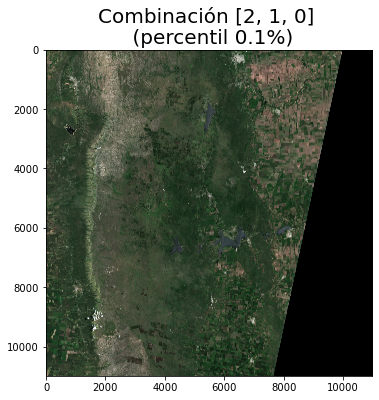

In [4]:
plot_rgb(s2_bandas, [2,1,0], p=0.1) #Plotea las bandas seleccionadas (indexado arranca en 0), con percentil 5%

In [3]:
radios = gpd.read_file('geometrias-corregidas/Embalses unificado.shp')#.set_index('id') #Levanta archivo shp
radios.drop(columns=['path', 'objeto','entidad','layer'], inplace = True)
radios['id'] = np.linspace(0,10,11).astype(int)
radios.set_index('id')

,gid,fna,Superficie,geometry
id,,,,
0,33857,Cerro Pelado,12.50,"POLYGON ((344214.773 6437426.358, 344209.609 6..."
1,30894,Los Molinos,19.40,"POLYGON ((352710.323 6479131.072, 352714.094 6..."
2,33861,Rio Tercero,46.44,"POLYGON ((365970.151 6439668.417, 365953.147 6..."
3,33879,Pichanas,4.09,"POLYGON ((291335.467 6578390.734, 291299.608 6..."
4,33880,Cruz del Eje,10.29,"POLYGON ((332232.611 6595717.129, 332232.269 6..."
5,33882,La ViÃ±a,5.67,"POLYGON ((307311.654 6472607.890, 307115.235 6..."
6,33884,Usina 3,2.67,"POLYGON ((375123.493 6437419.686, 375060.939 6..."
7,33885,Piedra Mora,8.75,"POLYGON ((375880.378 6437539.201, 375741.044 6..."
8,7814,San Roque,13.30,"POLYGON ((362251.484 6527725.212, 362201.415 6..."


In [4]:
radios.crs #metada del shp

<Derived Projected CRS: EPSG:32720>
Name: WGS 84 / UTM zone 20S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 66°W and 60°W, southern hemisphere between 80°S and equator, onshore and offshore. Argentina. Bolivia. Brazil. Falkland Islands (Malvinas). Paraguay.
- bounds: (-66.0, -80.0, -60.0, 0.0)
Coordinate Operation:
- name: UTM zone 20S
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [2]:
Norte = ['Cruz del Eje','San Roque','El Cajon']
Sur = ['Cerro Pelado','Los Molinos','Rio Tercero','La ViÃ±a','Usina 3','Piedra Mora','Arroyo Corto']

radiosN = radios.query('fna in @Norte')
radiosS = radios.query('fna in @Sur')
radiosS

NameError: name 'radios' is not defined

In [1]:
Norte

NameError: name 'Norte' is not defined

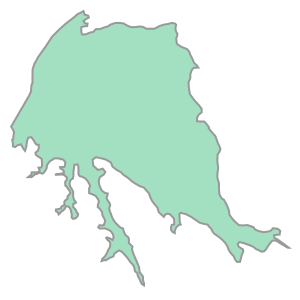

In [6]:
Sur_corregidos = ['Allende','Cerro Pelado','Rio Tercero','Los Molinos','Arroyo Corto','Usina 3','Sin Nombre2','Piedra Mora']
radiosSur_in = gpd.read_file('poligonossur/PoligonosEmbalsesSur18-10.shp')
radiosSur_in.loc[1].geometry

Norte_corregidos = ['Cruz del eje', 'El Cajon', 'San Roque']
radiosNorte_in = gpd.read_file('poligonosnorte/PoligonosEmbalses18-10.shp')
radiosNorte_in.loc[0].geometry

In [7]:
radiosSur = radiosSur_in.assign(fna=Sur_corregidos)
radiosNorte = radiosNorte_in.assign(fna=Norte_corregidos)

In [8]:
radiosSur.set_index('fna')
radiosSur.drop(columns=['id'], inplace = True)
radiosSur = radiosSur[['fna','geometry']]

radiosNorte.set_index('fna')
radiosNorte.drop(columns=['id'], inplace = True)
radiosNorte = radiosNorte[['fna','geometry']]
radiosSur

,fna,geometry
0,Allende,"POLYGON ((309760.000 6477420.000, 309780.000 6..."
1,Cerro Pelado,"POLYGON ((344100.000 6437120.000, 344120.000 6..."
2,Rio Tercero,"POLYGON ((365320.000 6440880.000, 365380.000 6..."
3,Los Molinos,"POLYGON ((354400.000 6483300.000, 354420.000 6..."
4,Arroyo Corto,"POLYGON ((351300.000 6434980.000, 351320.000 6..."
5,Usina 3,"POLYGON ((371960.000 6438900.000, 371980.000 6..."
6,Sin Nombre2,"POLYGON ((367740.000 6441120.000, 367760.000 6..."
7,Piedra Mora,"POLYGON ((380320.000 6441800.000, 380360.000 6..."


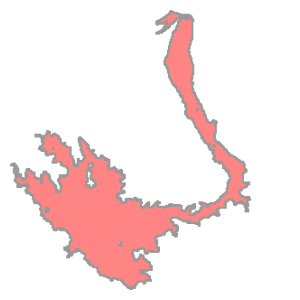

In [11]:
radiosSur.loc[0].geometry

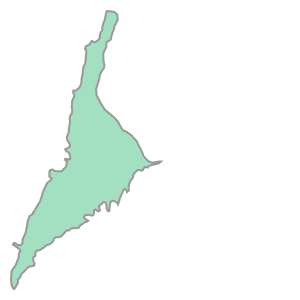

In [12]:
IDEmbalse = 2
nombre = radiosNorte.loc[IDEmbalse].fna
poligono = radiosNorte.loc[IDEmbalse].geometry #geometría del octavo elemento de shp
poligono

In [13]:
s2_plot_extent = plotting_extent(s2) #Bordes de la region a graficar
s2_plot_extent

(300000.0, 409800.0, 6490240.0, 6600040.0)

In [14]:
# Ploteo de la imagen con los poligonos encima

bandasPosicion = [0,1,2] #Norte
# bandasPosicion = [2,1,0] #SUR RGB


# img = nequalize(s2_bandas[bandasPosicion], p=5, nodata = None)
# fig, ax = plt.subplots(figsize = (15,8))
# show(img, ax=ax, extent = s2_plot_extent, cmap = 'gray')
# radiosS.boundary.plot(ax=ax, edgecolor = 'red')
# plt.show()

<AxesSubplot:>

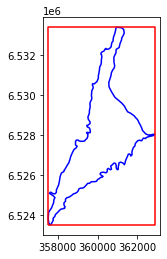

In [15]:
# RECORTO LA ZONA DE INTERES
extent = poligono.envelope

data = [poligono, extent]
gpd.GeoSeries(data).boundary.plot(color=['b', 'r'])

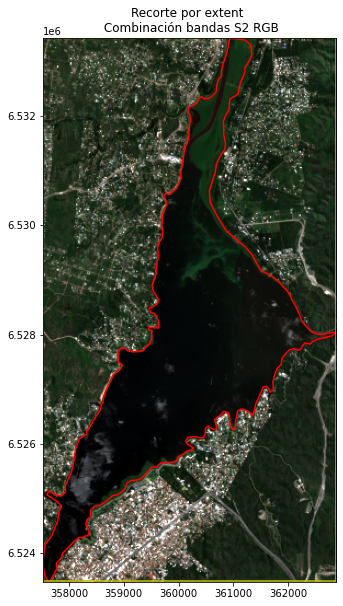

In [16]:
s2_clip, clip_transform = mask(dataset = s2, shapes = [extent], crop = True)
fig, ax = plt.subplots(figsize = (10,10))
show(nequalize(s2_clip[[2,1,0]],p=0.5,nodata = None), ax=ax, transform=clip_transform)
gpd.GeoSeries(data).boundary.plot(ax=ax,color=['r', 'y'])
plt.title("Recorte por extent \n Combinación bandas S2 RGB")
plt.show()

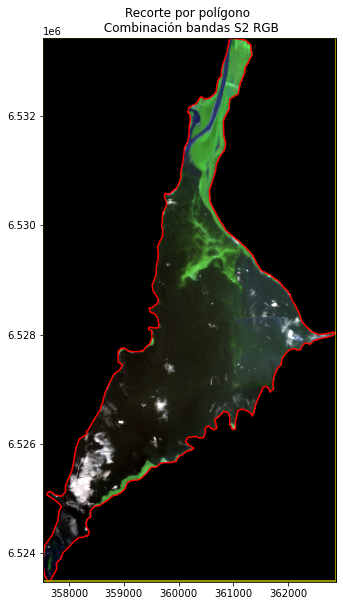

In [17]:
# Me quedo solo con lo dentro de la mascara vectorial
s2_mask, mask_transform  = mask(dataset = s2, shapes = [poligono], crop = True)

fig, ax = plt.subplots(figsize = (10,10))
show(nequalize(s2_mask[bandasPosicion], p=0.5), ax=ax,transform=mask_transform)
gpd.GeoSeries(data).boundary.plot(ax=ax,color=['r', 'y'])
plt.title("Recorte por polígono \n Combinación bandas S2 RGB")
plt.show()

In [18]:
# s2_rgb = s2_mask[[2,1,0]]/10000
# s2_rgb = s2_rgb[s2_rgb!=0]

# plt.hist(s2_rgb.flatten(), 100); 

In [19]:
reescalado = 10000

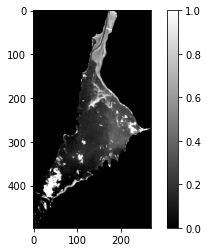

In [20]:
s2_mono = s2_mask[0]/reescalado
plt.imshow(nequalize(s2_mono, p = 5), cmap='gray')
plt.colorbar()

-----------------------------
# Clasificadores

In [4]:
from sklearn.cluster import KMeans

In [1]:
raster_fn = 'Imagenes enero 2021/Norte_20mTODOS.tif'

with rasterio.open(raster_fn) as src:
    img = src.read()
    crs = src.crs
    gt = src.transform
    
d,x,y = s2_mask.shape
X = s2_mask.reshape([d,x*y]).T
X = X/10000

NameError: name 'rasterio' is not defined

In [174]:
bandas = ['Banda 1', 'Azul', 'Verde', 'Rojo', 'Banda 5', 'Banda 6', 'Banda 7', 'NIR', 'Banda 9', 'SWIR 1', 'SWIR 2']

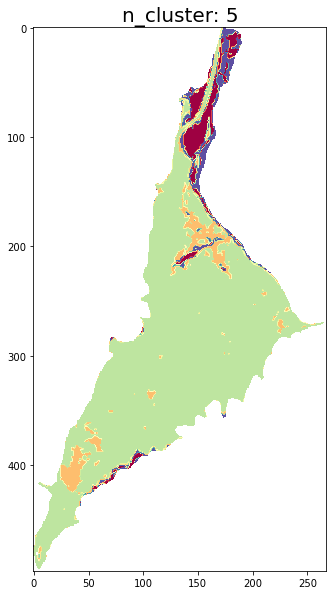

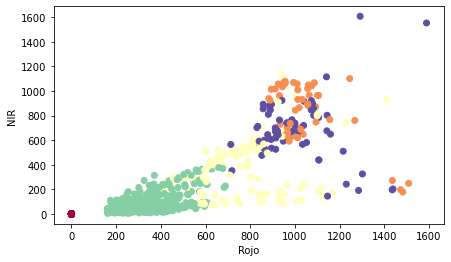

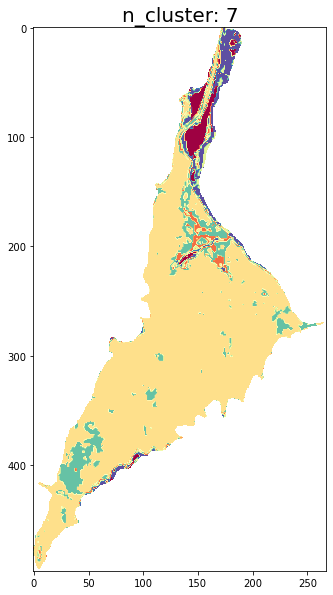

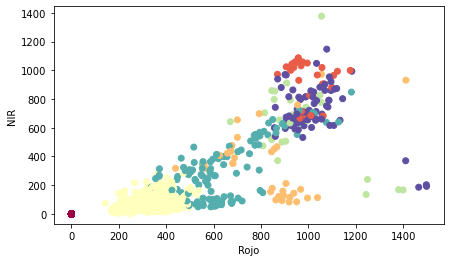

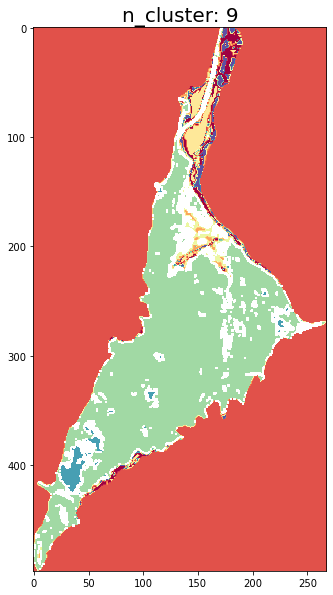

...

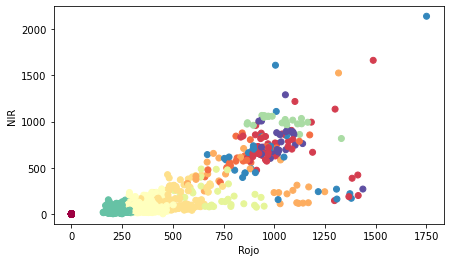

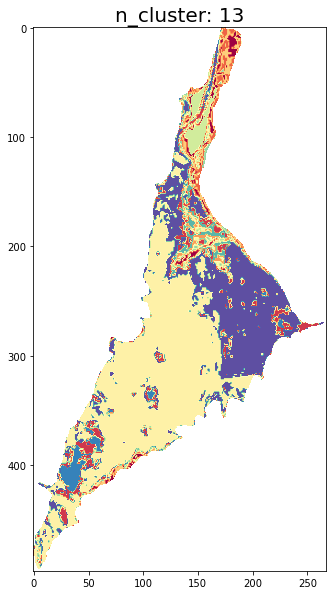

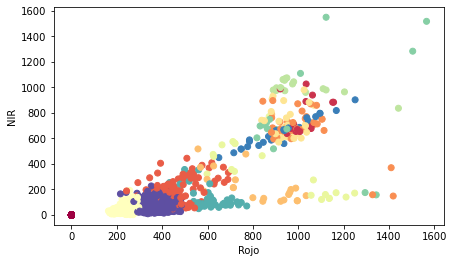

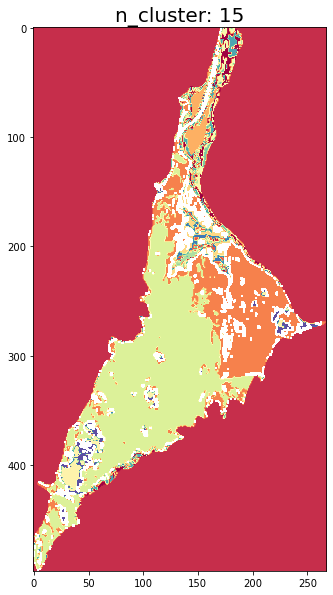

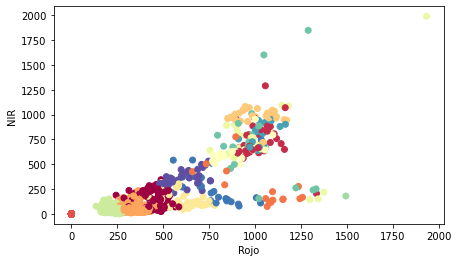

In [177]:
for i in [5,7,9,11,13,15]:
    kmeans = KMeans(n_clusters=i)#, random_state=0)
    kmeans.fit(X)
    L = kmeans.labels_
    Yimg = L.reshape([x,y])
    Yimg = Yimg.astype('float64')
    Yimg[Yimg==0.] = np.nan
    
    plt.figure(figsize=(15,10))
    plt.title('n_cluster: '+str(i), fontsize = 20)
    show(Yimg, cmap='Spectral')
    
    bandx, bandy = 3,7
    
    N = 5000
    R = np.random.randint(low=0, high=X.shape[0],size=N)#X.shape[0])
    plt.figure(figsize=(7,4))
    plt.scatter(X[R,bandx], X[R,bandy], c=L[R], cmap='Spectral')
    plt.xlabel(bandas[bandx])
    plt.ylabel(bandas[bandy])

In [97]:
from kPOD import k_pod
# from kPOD import fill_missing_indices

inputdata = ndvi(s2_mask,2,6,10000)
# data_missing = fill_missing_indices(s2b, missing_indices)
clustering_results = k_pod(inputdata, 2)

cluster_assignments = clustering_results[0]
cluster_centers = clustering_results[1]

cluster_assignments, cluster_centers

-----------------
# Firmas espectrales


In [133]:
blue = delNone(s2_mask[bandasPosicion[2]],0,reescalado)
green = delNone(s2_mask[bandasPosicion[1]],0,reescalado)
red = delNone(s2_mask[bandasPosicion[0]],0,reescalado)
nir = delNone(s2_mask[6],0,reescalado)

Text(0.5, 0, 'Nir')

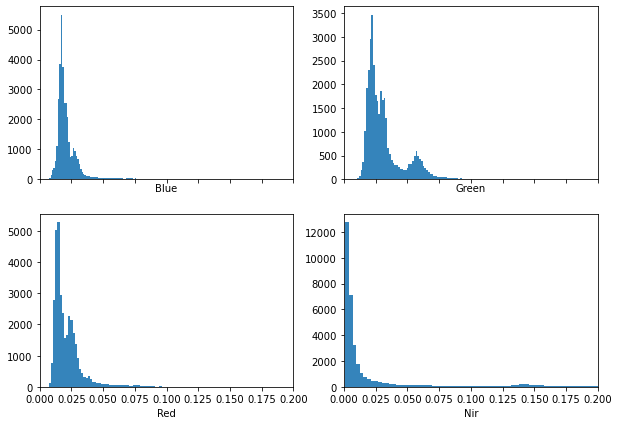

In [134]:
fig, ax = plt.subplots(2,2, sharex = True, figsize = (10,7))
ax[0,0].hist(blue, 100, alpha = 0.9, label = 'Blue');
ax[0,1].hist(green, 100, alpha = 0.9, label = 'Green');
ax[1,0].hist(red, 100, alpha = 0.9, label = 'Red');
ax[1,1].hist(nir, 100, alpha = 0.9, label = 'NIR');
ax[0,0].set_xlim(0,0.2)

ax[0,0].set_xlabel('Blue')
ax[0,1].set_xlabel('Green')
ax[1,0].set_xlabel('Red')
ax[1,1].set_xlabel('Nir')

In [135]:
#Calcula medias y desviacion estandar para cada banda

[mean_b, mean_g, mean_r, mean_nir] = [np.mean(blue), np.mean(green), np.mean(red), np.mean(nir)]
[std_b, std_g, std_r, std_nir] = [np.std(blue), np.std(green), np.std(red), np.std(nir)]

medias = [mean_b, mean_g, mean_r, mean_nir]
stds = np.asarray([std_b, std_g, std_r, std_nir])
stds = np.asarray([std_b, std_g, std_r, std_nir])/np.sqrt(nir.shape[0])

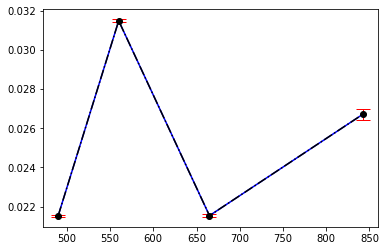

In [136]:
long = [490, 560, 665, 842]

#Quizas habría que utilizar el error estadistico y no la desviacion como el error
plt.errorbar(long, medias, marker = 'o', yerr = stds, elinewidth = 1, ls = '-.', color = 'k', ecolor = 'red', capsize=7)
plt.plot(long, medias, 'b')


In [137]:
means = []
desvs = []
for i in range(len(s2_mask)):
    aux = delNone(s2_mask[i],0,reescalado)
    means.append(np.mean(aux))
    desvs.append(np.std(aux)/np.sqrt(len(aux)))
    
means = np.asarray(means)
desvs = np.asarray(desvs)

Text(0, 0.5, 'Reflectance')

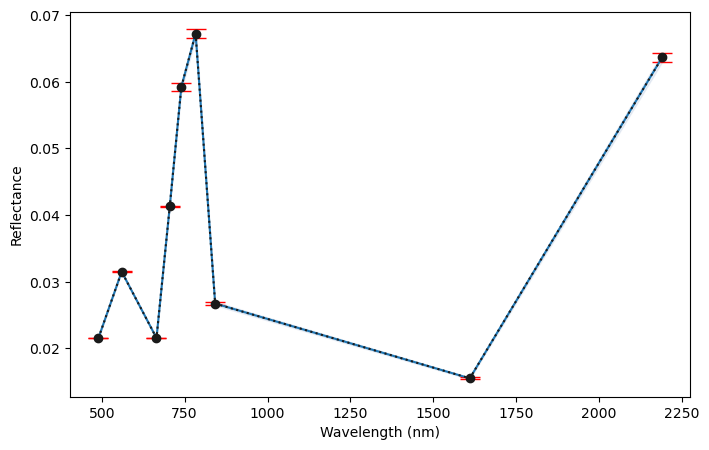

In [184]:
long = [490, 560, 665, 705, 740, 783, 842, 1610, 2190]


plt.figure(figsize = (8,5))
plt.errorbar(long, means, marker = 'o', yerr = desvs, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
plt.plot(long, means)#, label=l)
plt.fill_between(long, means-desvs, (means+desvs), color='b', alpha=.1)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')

# font = {'family':'serif', 'color':'darkgray', 'size':11}
# for x,t in zip([490, 560, 665, 842], ['Blue','Green','Red','NIR']):
#     plt.text(x-0.012, 0, t, fontdict=font)

# plt.savefig('Firma_SanRoque.png', dpi = 300)

In [ ]:
#Descomentar para guardar 
# guardar_GTiff('Procesados/S2_mask.tif', s2.crs, mask_transform, s2_mask, meta = {'dtype': 'uint16', 'nodata': 0})

-----------------------
Indices
--------

In [95]:
#Calculo NDVI
def ndvi(array, bandaR, bandaNIR, factor): 
    red = np.asarray(array[bandaR])/factor
    nir = np.asarray(array[bandaNIR])/factor
    
    return (nir-red)/(nir+red)

#Calculo NDWI
def ndwi(array, bandaG, bandaNIR,factor): 
    green = np.asarray(array[bandaG])/factor
    nir = np.asarray(array[bandaNIR])/factor
    
    return (green - nir)/(nir+green)

def indice(array, banda1, banda2, factor): #en la primera banda va el que esta sumando en el numerador
    aux1 = np.asarray(array[banda1])/factor
    aux2 = np.asarray(array[banda2])/factor
    
    return (aux1-aux2)/(aux1+aux2)

In [182]:

matplotlib.rc_file_defaults()

Text(0.5, 1.0, 'NDWI - San Roque')

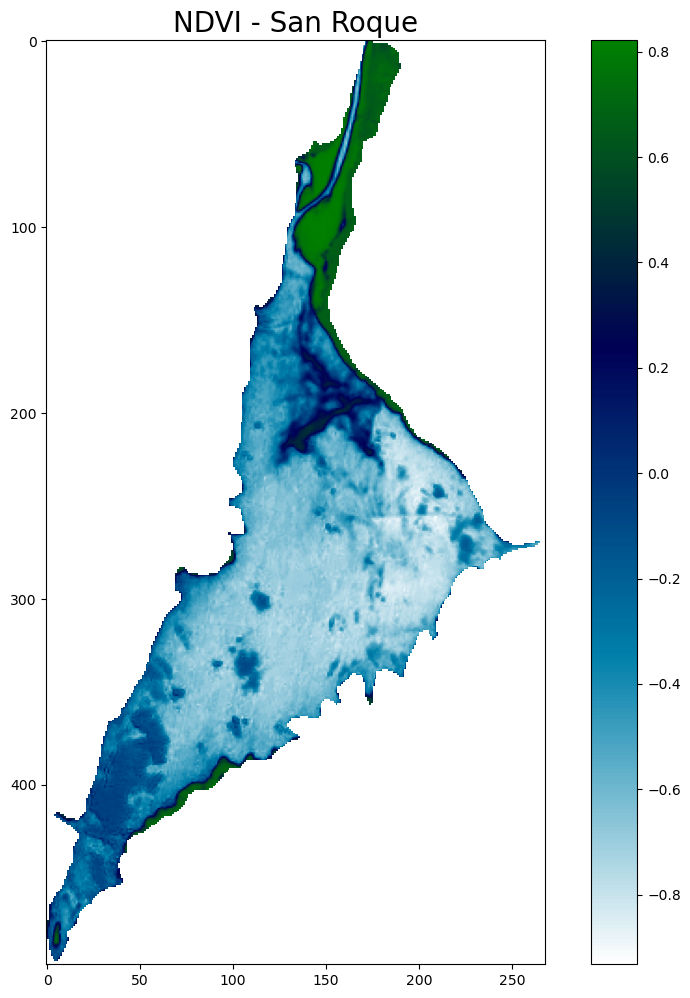

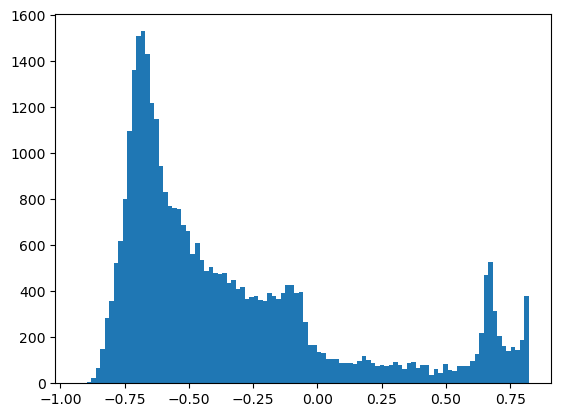

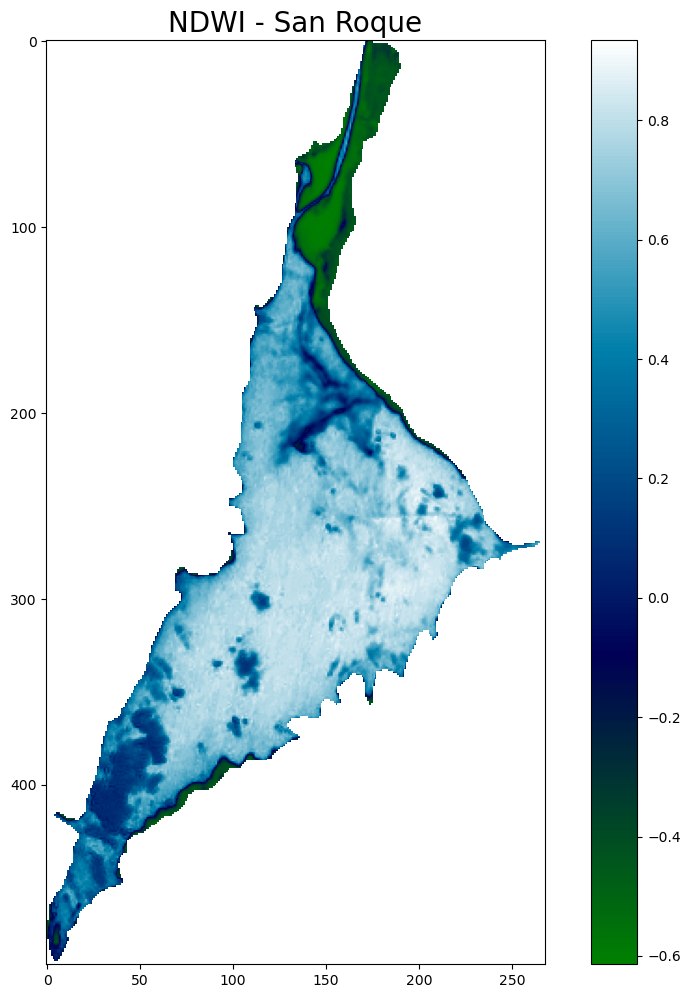

In [186]:
# os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
# Documentos Facultad - Conicet/Cursos/Tele - UNSAM/Scipts/Plots
plt.figure(figsize=(12,12))
plt.imshow(ndvi(s2_mask,2,6, 10000), cmap='ocean_r')
plt.colorbar()
plt.title('NDVI - '+nombre,  fontsize = 20)


plt.figure()
plt.hist(ndvi(s2_mask,2,6, 10000).flatten(), 100)
# # plt.savefig('Plots/ndvi_'+nombre+'.png', dpi = 300)

plt.figure(figsize=(12,12))
plt.imshow(ndwi(s2_mask,1,6,10000), cmap='ocean')
plt.colorbar()
plt.title('NDWI - '+nombre,  fontsize = 20)

# plt.savefig('Plots/ndwi_'+nombre+'.png', dpi = 300)

# os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

In [176]:
indicesTC = [0,1,2,6,7,8] #Sur
# indicesTC = [2,1,0,6,7,8] #Norte
matriz = []
matriz2 = []
coeficientesS2 = [[0.3510, 0.3813, 0.3437, 0.7196, 0.2396, 0.1949],
                  [-0.3599, -0.3533, -0.4734, 0.6633, 0.0087, -0.2856],
                  [0.2578, 0.2305, 0.0883, 0.1071, -0.7611, -0.5308]] 

for i in indicesTC:
    matriz.append(s2_clip[i]/reescalado)
    matriz2.append(s2_mask[i]/reescalado)
    
[brillo, verdor, humedad] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz)
[brilloM, verdorM, humedadM] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz2)

In [189]:
brilloM[brilloM==0] = np.nan
verdorM[verdorM==0] = np.nan
humedadM[humedadM==0] = np.nan

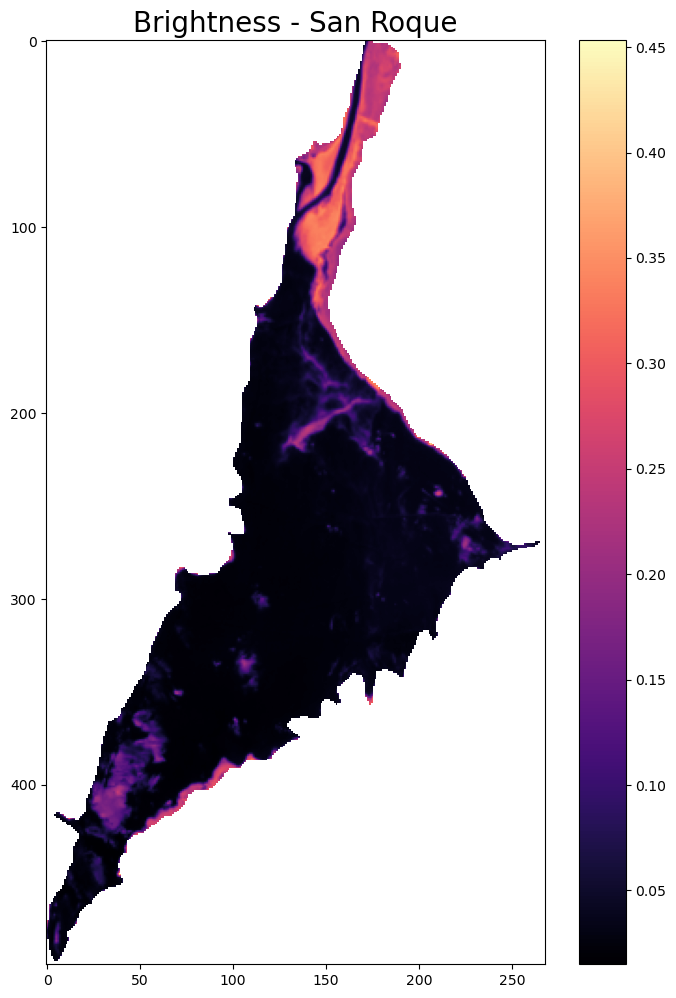

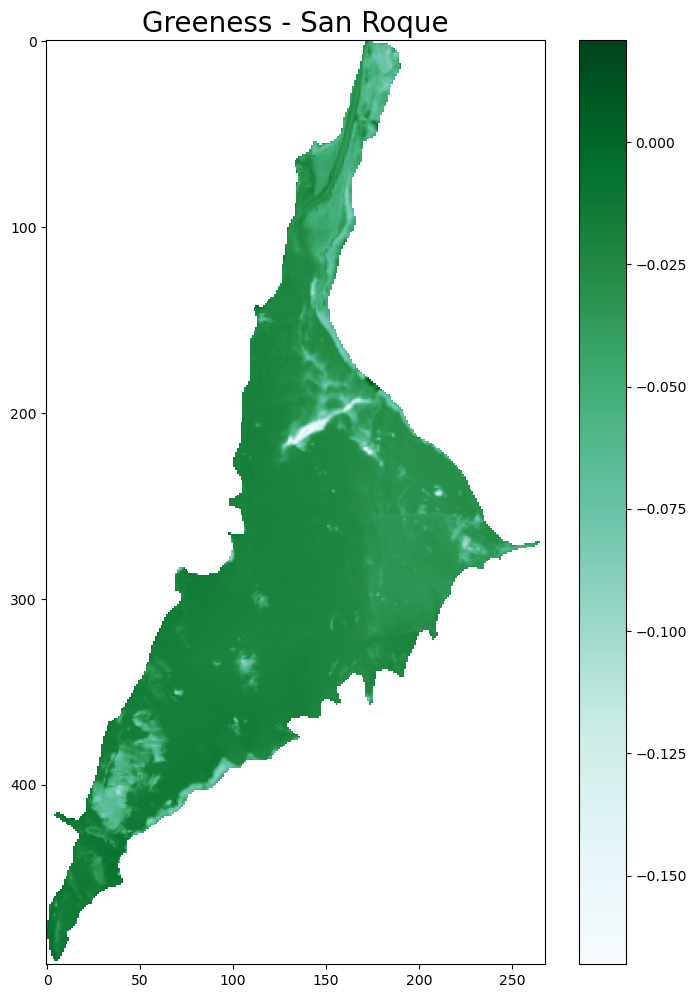

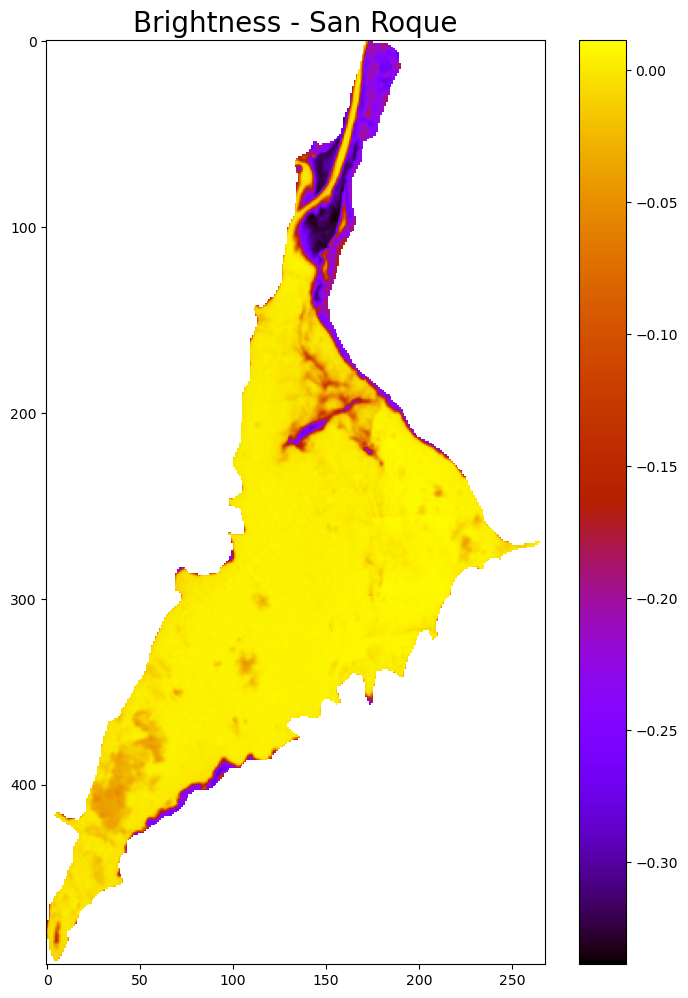

In [191]:
os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
# nombre += '-mask'

masked_arrayB = np.ma.array(brilloM, mask=np.isnan(brilloM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayB, cmap='magma')
plt.colorbar()
plt.title('Brightness - '+nombre,  fontsize = 20)
plt.savefig('Plots/Brightness_'+nombre+'.png', dpi = 300)


masked_arrayV = np.ma.array(verdorM, mask=np.isnan(verdorM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayV, cmap='BuGn')
plt.colorbar()
plt.title('Greeness - '+nombre,  fontsize = 20)
plt.savefig('Plots/Greeness_'+nombre+'.png', dpi = 300)

masked_arrayH = np.ma.array(humedadM, mask=np.isnan(humedadM))
plt.figure(figsize = (9,12))
plt.imshow(masked_arrayH, cmap='gnuplot')
plt.colorbar()
plt.title('Brightness - '+nombre,  fontsize = 20)
plt.savefig('Plots/Wetness_'+nombre+'.png', dpi = 300)

os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

In [169]:
aux1 = brilloM.flatten()
# aux1 = aux1[aux1!=np.nan]
aux2 = verdorM.flatten()
aux3 = humedadM.flatten()
# plt.hist(aux1)

In [171]:
auxx = aux1[np.isfinite(aux1)]
auxx

array([0.04852616, 0.08714789, 0.19874381, ..., 0.03548897, 0.05733482,
       0.04268024])

<function seaborn.rcmod.reset_orig()>

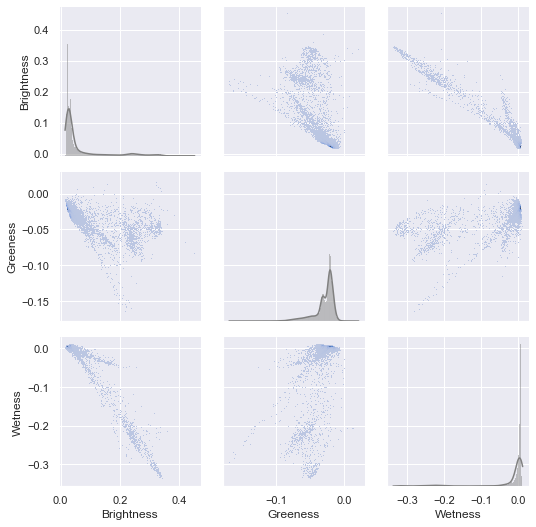

In [175]:
sns.set()
stack_data2 = np.stack((aux1[np.isfinite(aux1)], aux2[np.isfinite(aux2)], aux3[np.isfinite(aux3)])).T
data = pd.DataFrame(stack_data2, columns = ['Brightness','Greeness','Wetness'])

f = sns.PairGrid(data)
# f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
f.map_upper(sns.histplot)
f.map_lower(sns.histplot)
f.map_diag(sns.histplot, kde=True, color='.5')
# f.set(xlim = (0,0.15), ylim = (0,0.15))
sns.reset_orig

Text(0.5, 0, 'Brightness')

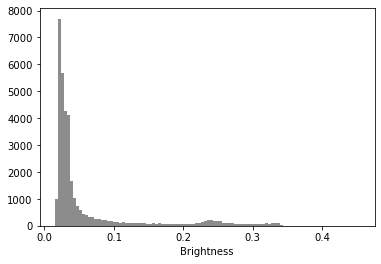

In [97]:
plt.figure()
plt.hist(brilloM[brilloM!=0].flatten(), 100, alpha = 0.9, color='gray');
plt.xlabel('Brightness')

In [112]:
radiosAux = radiosNorte

if radiosAux.shape == radiosSur.shape:
    IDN = [0,1,2,3,4,5,6,7]
else:
    IDN = [0,1,2]
print(IDN)

[0, 1, 2]


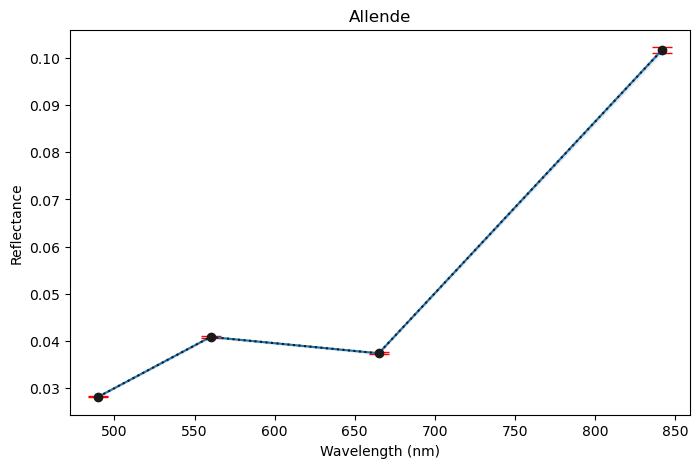

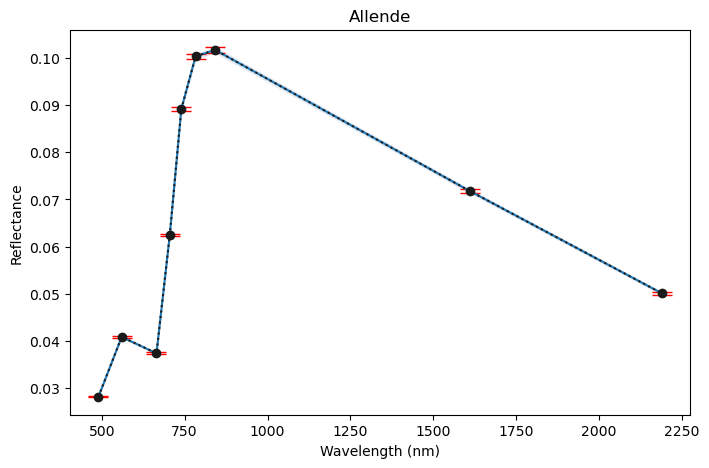

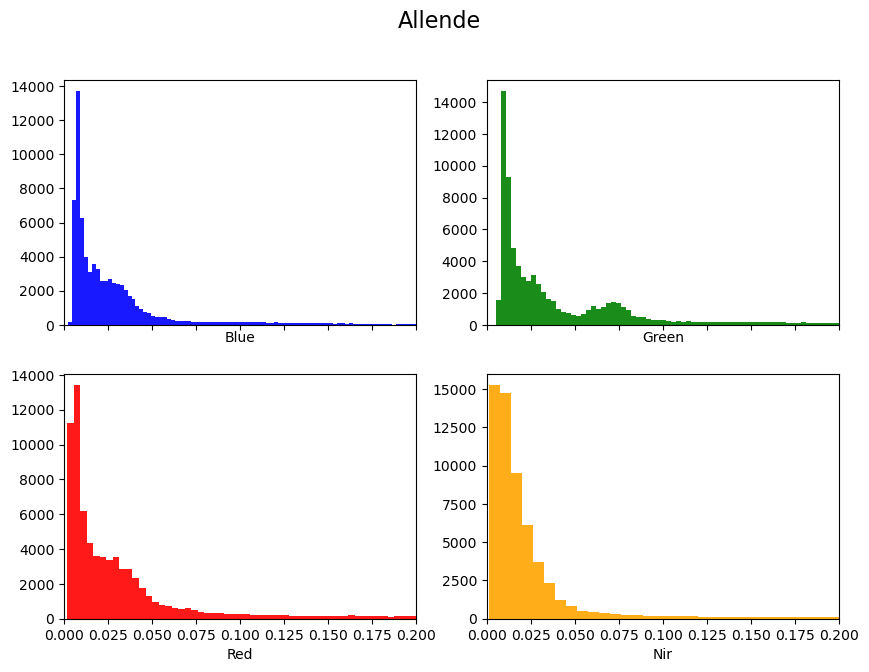

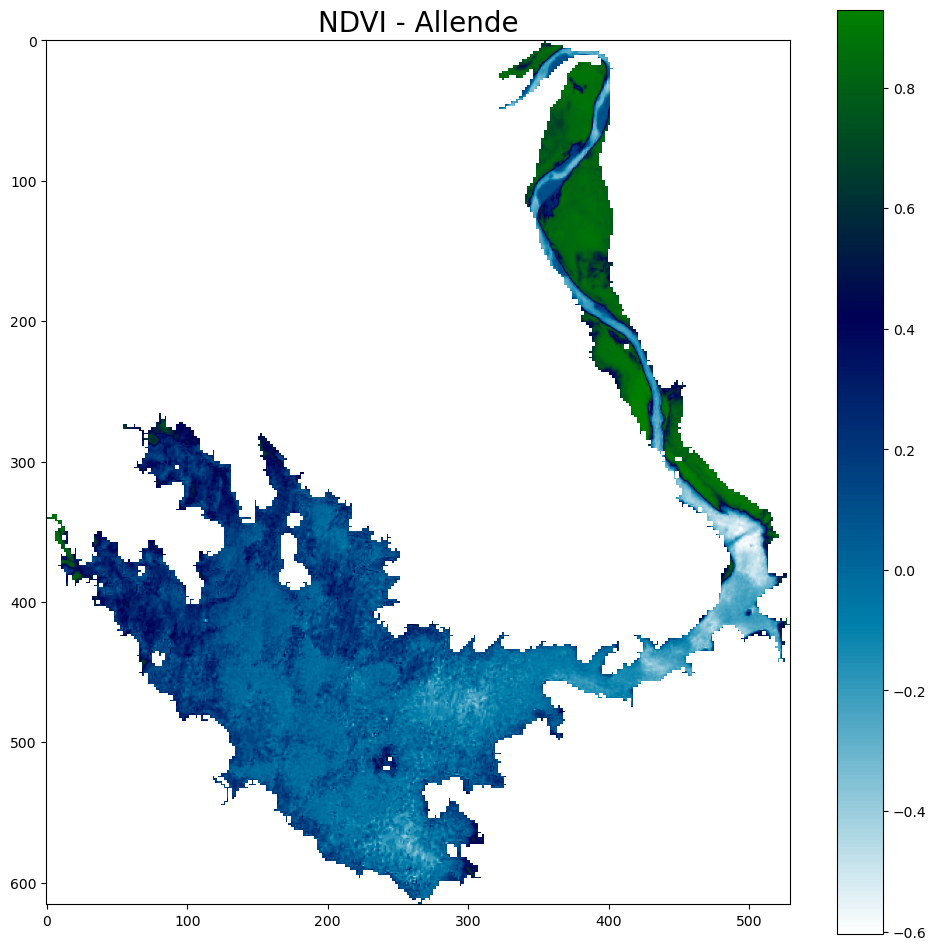

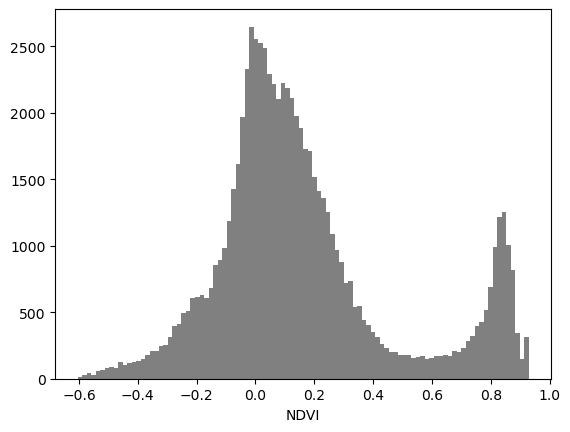

...

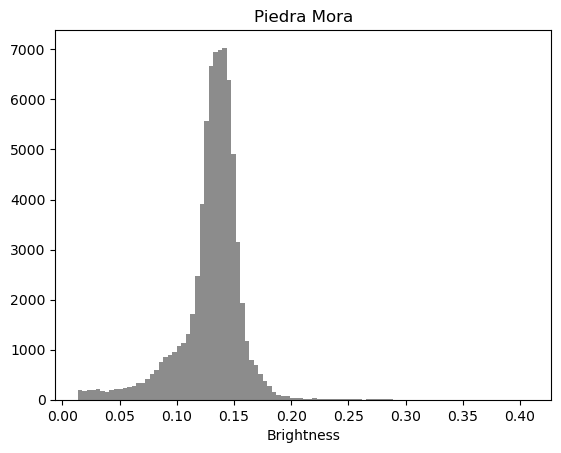

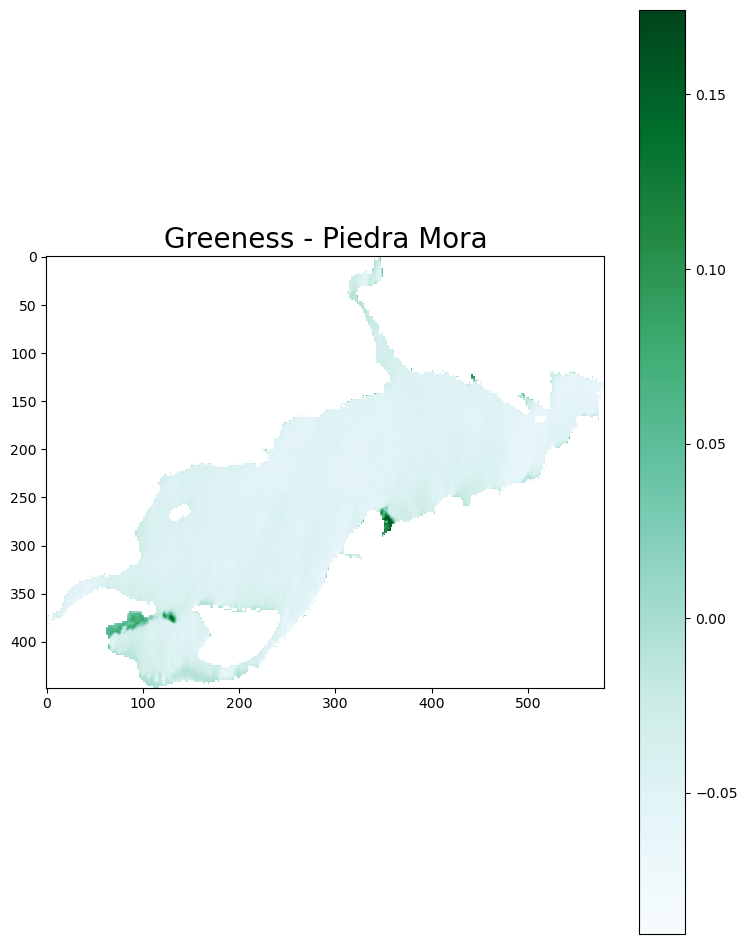

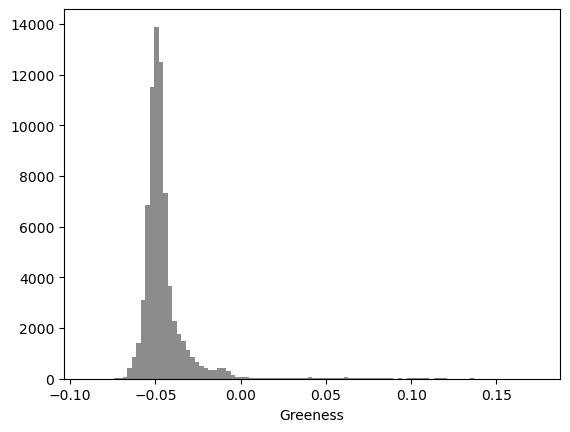

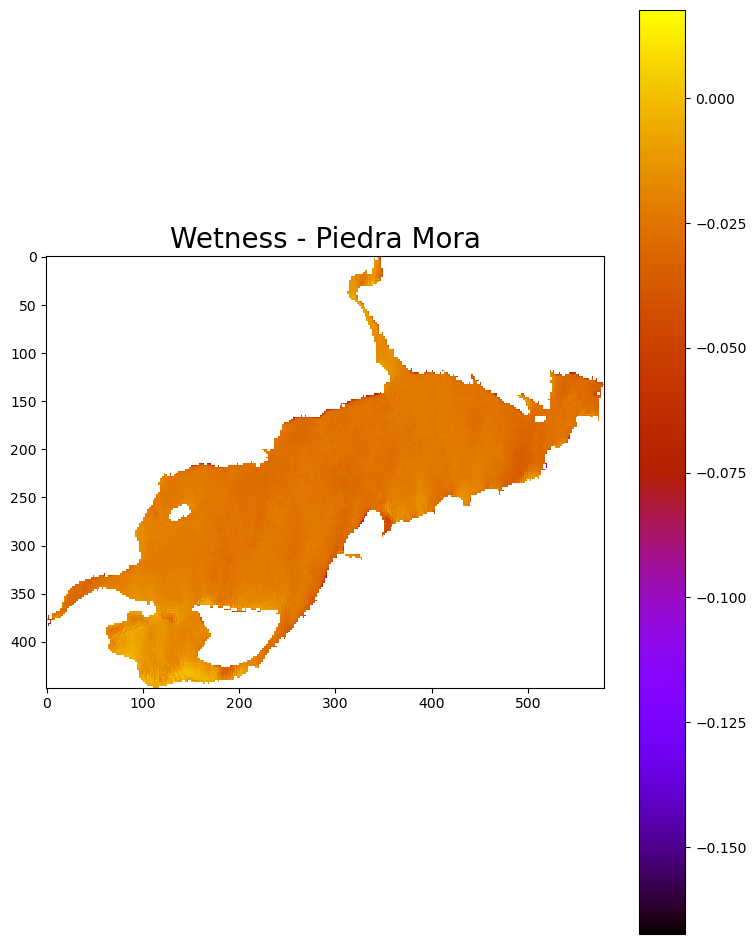

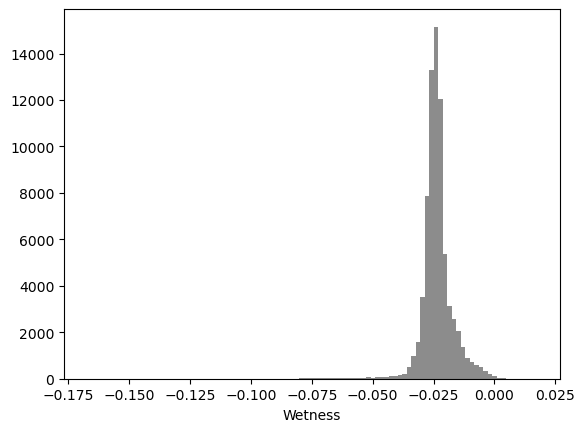

In [200]:
long = [490, 560, 665, 705, 740, 783, 842, 1610, 2190]
short = [490, 560, 665, 842]

radiosAux = radiosSur

if radiosAux.shape == radiosSur.shape:
    IDN = [0,1,2,3,4,5,6,7]
else:
    IDN = [0,1,2]
# print(IDN)

for ID in IDN:
    IDEmbalse = ID
    reescalado = 10000
    
    indicesTC = [0,1,2,6,7,8] #Sur
    indiceRed = 2 #Sur
    indiceBlue = 0 #Sur
    
    nombre = radiosAux.loc[IDEmbalse].fna
    poligono = radiosAux.loc[IDEmbalse].geometry #geometría del octavo elemento de shp
    s2_plot_extent = plotting_extent(s2) #Bordes de la region a graficar

    # RECORTO LA ZONA DE INTERES
    extent = poligono.envelope

    # data = [poligono, extent]
    # gpd.GeoSeries(data).boundary.plot(color=['b', 'r'])

    s2_clip, clip_transform = mask(dataset = s2, shapes = [extent], crop = True)
    s2_mask, mask_transform  = mask(dataset = s2, shapes = [poligono], crop = True)
    
    
    
    blue = delNone(s2_mask[indiceBlue],0,reescalado)
    green = delNone(s2_mask[1],0,reescalado)
    red = delNone(s2_mask[indiceRed],0,reescalado)
    nir = delNone(s2_mask[6],0,reescalado)
    
    means = []
    desvs = []
    for i in range(len(s2_mask)):
        aux = delNone(s2_mask[i],0,reescalado)
        means.append(np.mean(aux))
        desvs.append(np.std(aux)/np.sqrt(len(aux)))


    
    os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
    
    means2 = means[:3]
    means2.append(means[6])
    desvs2 = desvs[:3]
    desvs2.append(desvs[6])
    
    means = np.asarray(means)
    desvs = np.asarray(desvs)
    means2 = np.asarray(means2)
    desvs2 = np.asarray(desvs2)
    
    plt.figure(figsize = (8,5))
    plt.errorbar(short, means2, marker = 'o', yerr = desvs2, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
    plt.plot(short, means2)#, label=l)
    plt.fill_between(short, means2-desvs2, (means2+desvs2), color='b', alpha=.1)
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.title(nombre)
    plt.savefig('Plots/firmasRGBNIR_'+nombre+'.png', dpi=200)
    
    
    plt.figure(figsize = (8,5))
    plt.errorbar(long, means, marker = 'o', yerr = desvs, elinewidth = 1, ls = 'dotted', color = 'k', ecolor = 'red', capsize=7)
    plt.plot(long, means)#, label=l)
    plt.fill_between(long, means-desvs, (means+desvs), color='b', alpha=.1)
    plt.xlabel('Wavelength (nm)')
    plt.ylabel('Reflectance')
    plt.title(nombre)
    plt.savefig('Plots/firmas_'+nombre+'.png', dpi=200)
    
    fig, ax = plt.subplots(2,2, sharex = True, figsize = (10,7))
    ax[0,0].hist(blue, 100, alpha = 0.9, label = 'Blue', color = 'blue');
    ax[0,1].hist(green, 100, alpha = 0.9, label = 'Green', color = 'green');
    ax[1,0].hist(red, 100, alpha = 0.9, label = 'Red', color = 'red');
    ax[1,1].hist(nir, 100, alpha = 0.9, label = 'NIR', color = 'orange');
    ax[0,0].set_xlim(0,0.2)

    ax[0,0].set_xlabel('Blue')
    ax[0,1].set_xlabel('Green')
    ax[1,0].set_xlabel('Red')
    ax[1,1].set_xlabel('Nir')
    fig.suptitle(nombre, fontsize=16)

    fig.savefig('Plots/HistoRGBNIR_'+nombre+'.png', dpi = 200)
    
    # Documentos Facultad - Conicet/Cursos/Tele - UNSAM/Scipts/Plots
    plt.figure(figsize=(12,12))
    plt.imshow(ndvi(s2_mask,indiceRed,6,10000), cmap='ocean_r')
    plt.colorbar()
    plt.title('NDVI - '+nombre,  fontsize = 20)
    plt.savefig('Plots/ndvi_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(ndvi(s2_mask,indiceRed,6, 10000).flatten(), 100, color='gray')
    plt.xlabel('NDVI')
    plt.savefig('Plots/ndvi_'+nombre+'-histograma.png', dpi = 300)
    
    plt.figure(figsize=(12,12))
    plt.imshow(indice(s2_mask,1,6,10000), cmap='ocean')
    plt.colorbar()
    plt.title('NDWI - '+nombre,  fontsize = 20)
    plt.savefig('Plots/ndwi_'+nombre+'.png', dpi = 300)

    # os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

    
    matriz = []
    matriz2 = []
    coeficientesS2 = [[0.3510, 0.3813, 0.3437, 0.7196, 0.2396, 0.1949],
                      [-0.3599, -0.3533, -0.4734, 0.6633, 0.0087, -0.2856],
                      [0.2578, 0.2305, 0.0883, 0.1071, -0.7611, -0.5308]] 

    for i in indicesTC:
        # matriz.append(s2_clip[i]/reescalado)
        matriz2.append(s2_mask[i]/reescalado)

    # [brillo, verdor, humedad] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz)
    [brilloM, verdorM, humedadM] = np.einsum('ij,jkl->ikl', coeficientesS2,matriz2)
    
    brilloM[brilloM==0] = np.nan
    verdorM[verdorM==0] = np.nan
    humedadM[humedadM==0] = np.nan
    
    # os.chdir("D:\\Documentos Facultad - Conicet\Cursos\Tele - UNSAM\Scipts")
    # nombre += '-mask'
    
    masked_arrayB = np.ma.array(brilloM, mask=np.isnan(brilloM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayB, cmap='magma')
    plt.colorbar()
    plt.title('Brightness - '+nombre,  fontsize = 20)
    plt.savefig('Plots/Brightness_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(brilloM[brilloM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Brightness')
    plt.title(nombre)
    plt.savefig('Plots/Brightness_'+nombre+'-histograma.png', dpi = 300)

    masked_arrayV = np.ma.array(verdorM, mask=np.isnan(verdorM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayV, cmap='BuGn')
    plt.colorbar()
    plt.title('Greeness - '+nombre,  fontsize = 20)
    plt.savefig('Plots/Greeness_'+nombre+'.png', dpi = 300)
    
    plt.figure()
    plt.hist(verdorM[verdorM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Greeness')
    plt.savefig('Plots/Greeness_'+nombre+'-histograma.png', dpi = 300)
    
    masked_arrayH = np.ma.array(humedadM, mask=np.isnan(humedadM))
    plt.figure(figsize = (9,12))
    plt.imshow(masked_arrayH, cmap='gnuplot')
    plt.colorbar()
    plt.title('Wetness - '+nombre,  fontsize = 20)
    plt.savefig('Plots/Wetness_'+nombre+'.png', dpi = 300)

    plt.figure()
    plt.hist(humedadM[humedadM!=np.nan].flatten(), 100, alpha = 0.9, color='gray');
    plt.xlabel('Wetness')
    plt.savefig('Plots/Wetness_'+nombre+'-histograma.png', dpi = 300)
    
    
    os.chdir("C:\\Users\\arell\\Documents\\Sentinel")

------------
Estadisticas
----------

In [ ]:
data=pd.DataFrame({'B':blue,'G':green,'R':red,'NIR':nir})#,'NDVI':ndvi(s2_mask,2,3).flatten()})#,'clase':[clases[y] for y in Y]})

In [ ]:
fig = plt.figure(figsize=(15,10))
sns.boxplot(data=data)#,x='clase', y='NDVI')
# plt.savefig('SalidasSur/boxplot.png',dpi=200)
fig = plt.figure(figsize=(15,10))
sns.violinplot(data=data)#,x='clase', y='NDVI')
# plt.savefig('SalidasSur/violinlot.png',dpi=200)

In [ ]:
fig = plt.figure(figsize=(10,5))
sns.scatterplot(data=data, x='R', y='G', alpha=0.3, s=15)
# plt.savefig('SalidasSur/scatterplot.png')

In [ ]:
bandx = 'NIR'
bandy = 'R'
# Estimate the 2D histogram
nbins = 200
H, xedges, yedges = np.histogram2d(data[bandx],data[bandy],bins=nbins)
 
# H needs to be rotated and flipped
H = np.rot90(H)
H = np.flipud(H)
 
# Mask zeros
Hmasked = np.ma.masked_where(H==0,H) # Mask pixels with a value of zero
 
# Plot 2D histogram using pcolor
fig2 = plt.figure(figsize=(10,5))
# sns.jointplot(data=data, x=bandx, y=bandy)l<
plt.pcolormesh(xedges,yedges,Hmasked)
plt.xlabel(bandx)
plt.ylabel(bandy)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Counts')

In [ ]:
plt.figure()
sns.jointplot(data=data, x=bandx, y=bandy, kind='kde', fill=True)
plt.savefig('SalidasSur/scatterplot.png',dpi=200)

In [ ]:
blue.shape

In [ ]:
bluee = s2_mask[0]/10000
greenn = s2_mask[1]/10000
redd = s2_mask[2]/10000
nirr = s2_mask[3]/10000

redd[redd == 0] = np.nan
greenn[greenn == 0] = np.nan
bluee[bluee == 0] = np.nan
nirr[nirr == 0] = np.nan 

# plt.hist(redd[np.isfinite(redd)], 50);
# plt.hist(redd.flatten(), 50);

In [ ]:
bluee = s2_mask[0]/10000
greenn = s2_mask[1]/10000
redd = s2_mask[2]/10000
nirr = s2_mask[3]/10000

bluee2 = bluee[(bluee!=0)]
greenn2 = greenn[greenn!=0]
redd2 = redd[redd!=0]
nirr2 = nirr[nirr!=0]

In [ ]:
np.where(bluee2 == np.max(bluee2))

In [ ]:
max(bluee2)

In [ ]:
# stack_data = np.stack((bluee[np.isfinite(bluee)],greenn[np.isfinite(greenn)],redd[np.isfinite(redd)],nirr[np.isfinite(nirr)])).T
stack_data2 = np.stack((bluee2, greenn2, redd2, nirr2)).T
data = pd.DataFrame(stack_data2, columns = ['b','g','r','nir'])

f = sns.PairGrid(data)
# f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
f.map_upper(sns.histplot)
f.map_lower(sns.histplot)
f.map_diag(sns.histplot, kde=True, color='.5')
f.set(xlim = (0,0.15), ylim = (0,0.15))

In [ ]:
# stack_data = np.stack((bluee[np.isfinite(bluee)],greenn[np.isfinite(greenn)],redd[np.isfinite(redd)],nirr[np.isfinite(nirr)])).T
stack_data2 = np.stack((bluee2, greenn2, redd2, nirr2)).T
data = pd.DataFrame(stack_data2, columns = ['b','g','r','nir'])

# f = sns.PairGrid(data)
# # f.fig.suptitle(Nombre, y=1.01, fontsize = 'large')
# f.map_upper(sns.kdeplot, fill = True)
# f.map_lower(sns.histplot)
# f.map_diag(sns.histplot, kde=True, color='.5')
# f.set(xlim = (0,0.15), ylim = (0,0.15))

In [ ]:
S = np.zeros((6,6))
b_mean = np.mean(data['b'])

In [ ]:
data.mean

In [ ]:
sns.scatterplot(data = data, x = 'r', y = 'b')